# <center> <h1>    🌳 🧑‍💻  🌴

# <center> <h1>  Decision Tree

* For regression
* For classification

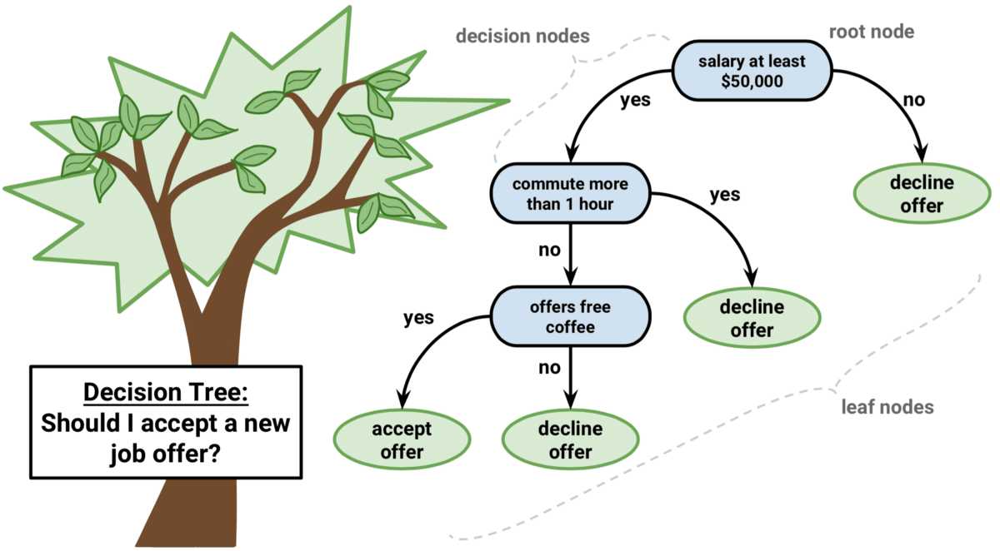


A decision tree works like this (it works through if else)


(Pay attention to the picture) 1st, he says whether the monthly salary is below 50,000 or less, if it is low, he will not accept the job
If it is greater than 50,000 and the time to the office is more than 1 hour, the job will not be accepted.
If he can go to the office within 1 hour, he will accept
Then he asks if free coffee is given at the office, if not, he will not accept the job
If yes, he will accept the job

Here, it is important to correctly find the topmost point in the beginning, i.e. question 1
If we put at the top the first question whether the office gives free coffee or not, it would be a big mistake.


For example, if we have data, then the highest correlation will make the first decision, so the column should be placed at the top

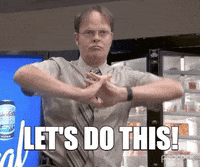

# <center> Decision Tree Regressor

In [1]:
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.preprocessing import OrdinalEncoder
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Let us have such data

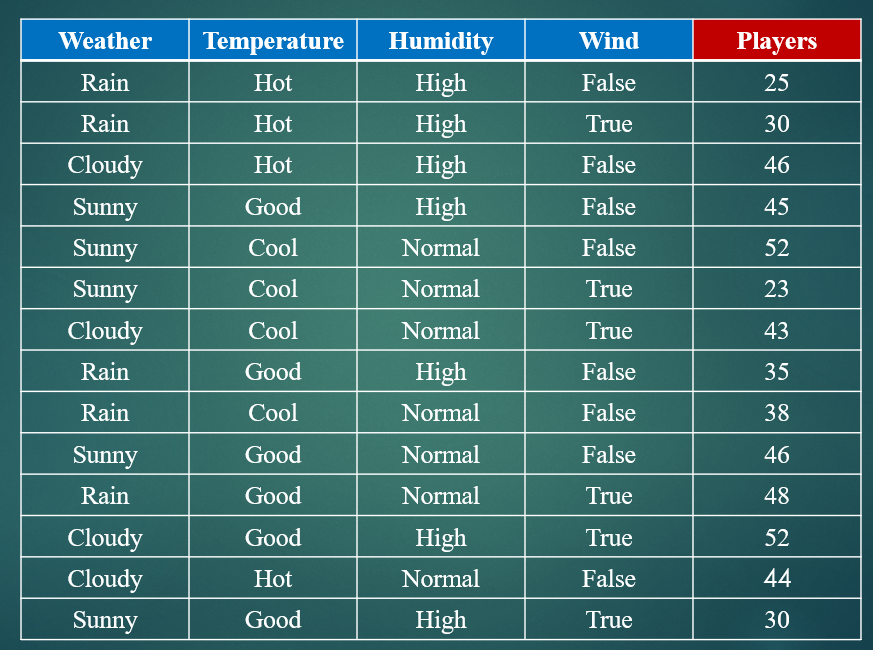

# Step 1. We can read the dataset

In [2]:
data = pd.read_csv("Datasets/DTree2.csv")
data

,Weather,Temp,Humidity,Wind,Players
0,Rainy,Hot,High,False,25
1,Rainy,Hot,High,True,30
2,Cloudy,Hot,High,False,46
3,Sunny,Good,High,False,45
4,Sunny,Cool,Normal,False,52
5,Sunny,Cool,Normal,True,23
6,Cloudy,Cool,Normal,True,43
7,Rainy,Good,High,False,35
8,Rainy,Cool,Normal,False,38
9,Sunny,Good,Normal,False,46


In [3]:
ordinal = OrdinalEncoder()
ordinal
# datani songa aylantirib olish uchun skleardagi OrdinalEncoder funksiyasidan foydalanamiz

OrdinalEncoder()

# Step 2. We can encode the label values of the dataset

In [4]:
data_x = ordinal.fit(data.drop("Players", axis=1))
data_x

OrdinalEncoder()

In [5]:
ordinal.categories_

[array(['Cloudy', 'Rainy', 'Sunny'], dtype=object),
 array(['Cool', 'Good', 'Hot'], dtype=object),
 array(['High', 'Normal'], dtype=object),
 array([False,  True])]

In [6]:
data_x = ordinal.transform(data.drop("Players", axis=1))
data_x

array([[1., 2., 0., 0.],
       [1., 2., 0., 1.],
       [0., 2., 0., 0.],
       [2., 1., 0., 0.],
       [2., 0., 1., 0.],
       [2., 0., 1., 1.],
       [0., 0., 1., 1.],
       [1., 1., 0., 0.],
       [1., 0., 1., 0.],
       [2., 1., 1., 0.],
       [1., 1., 1., 1.],
       [0., 1., 0., 1.],
       [0., 2., 1., 0.],
       [2., 1., 0., 1.]])

# Step 3. Let's find the std(standard deviation) of the players column

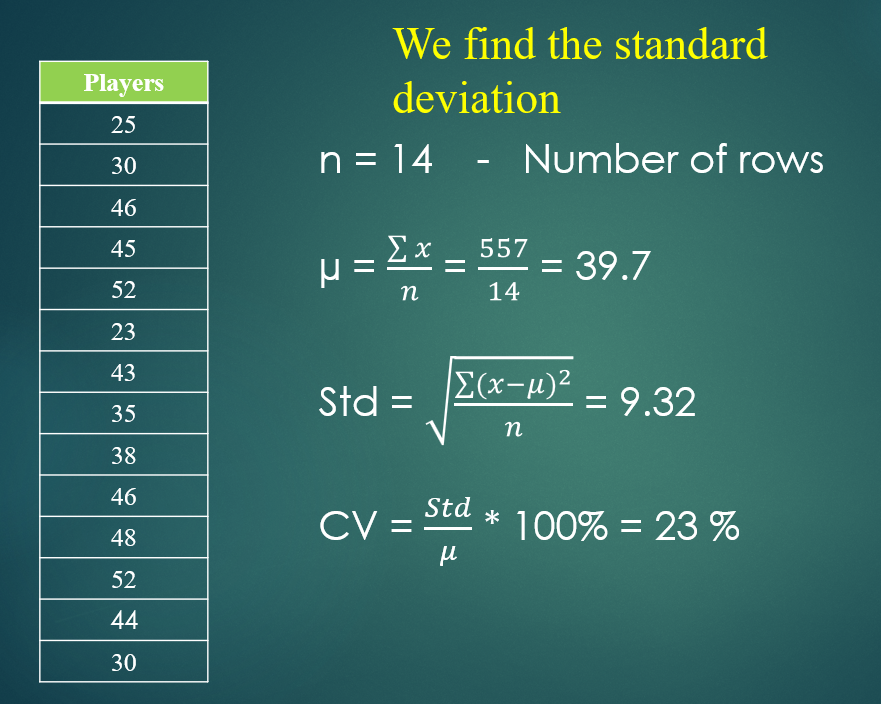

In [7]:
target1 = data["Players"].to_numpy()
target1

array([25, 30, 46, 45, 52, 23, 43, 35, 38, 46, 48, 52, 44, 30],
      dtype=int64)

In [8]:
target1.std()

9.321086474291743

## We find the STDR of each column against the Players (target value) column
`For this, first of all, we need to find the std of each column to the Players column.`
# 4.1 - step. In the Weather column we find STDs

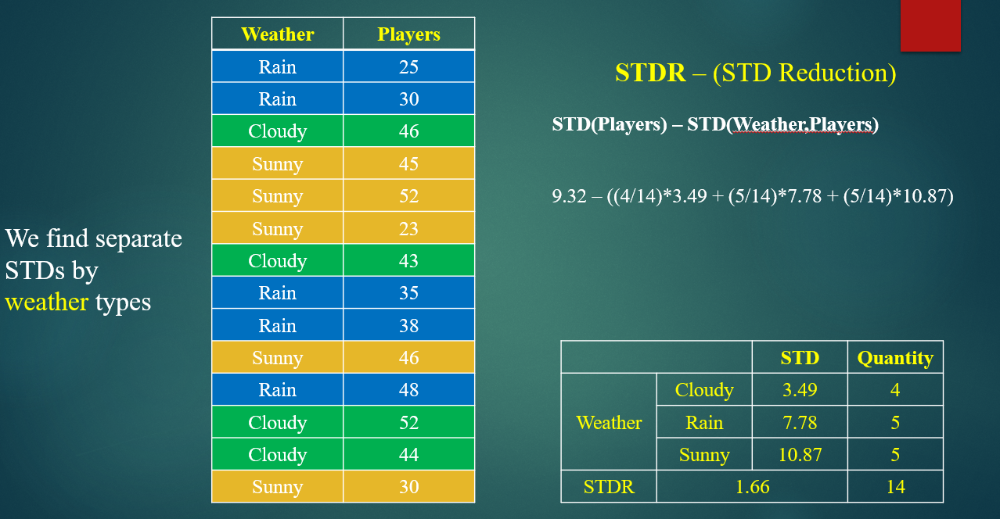

`So, first we select the Weather column and find separate standard deviations for each value in it, i.e. for Rainy, Cloudy and Sunny conditions. The formula for this is given below.`

### Finding the Rainfall std for the Weather column.


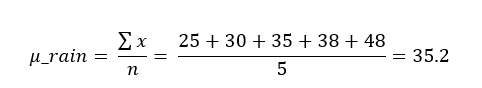


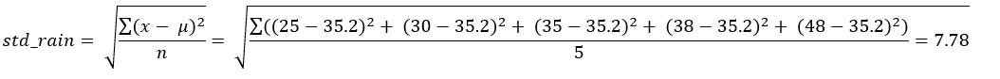

### The rest are found in the same way

In [9]:
data_weather1 = data.groupby("Weather").agg(Std = ("Players", lambda x: x.std(ddof=0)), Quantity = ("Players", np.count_nonzero))
data_weather1


,Std,Quantity
Weather,,
Cloudy,3.491060,4
Rainy,7.782031,5
Sunny,10.870143,5


# Step 4.2. In the Weather column we find STDR

In [10]:
stdr_weather1 = target1.std() - np.dot(data_weather1["Quantity"]/14, data_weather1["Std"])
stdr_weather1


1.6621503366302335

# Step 5.1. In the humidity column we find STDs

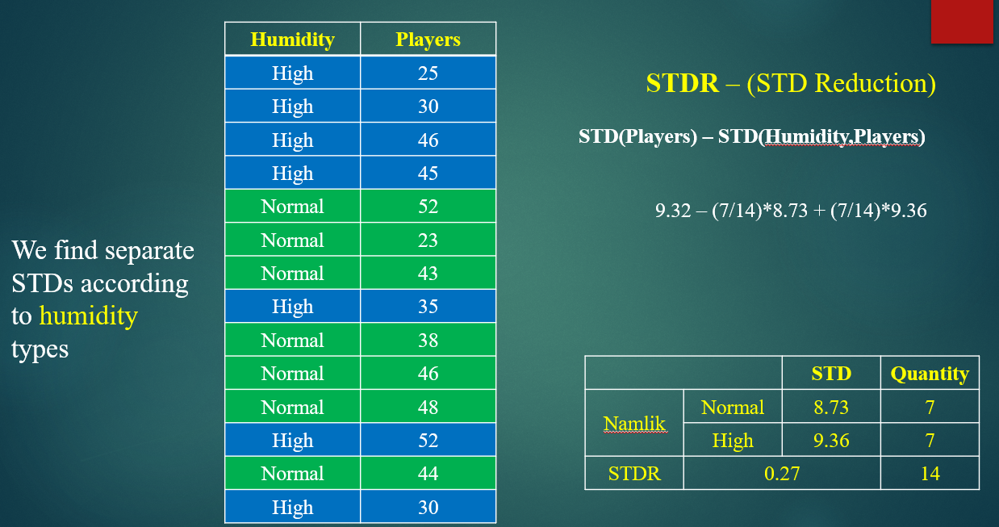

In [11]:
data_humidity1 = data.groupby("Humidity").agg(Std = ("Players", lambda x: x.std(ddof=0)), Quantity = ("Players", np.count_nonzero))
data_humidity1


,Std,Quantity
Humidity,,
High,9.363411,7
Normal,8.734169,7


# Step 5.2. Along the humidity column we find STDR



In [12]:
stdr_humidity1 = target1.std() - np.dot(data_humidity1["Quantity"]/14, data_humidity1["Std"])
stdr_humidity1


0.272296195489826

# Step 6.1. In the Temp column we find STDs

In [13]:
data_temp1 = data.groupby("Temp").agg(Std = ("Players", lambda x: x.std(ddof=0)), Quantity = ("Players", np.count_nonzero))
data_temp1


,Std,Quantity
Temp,,
Cool,10.511898,4
Good,7.652160,6
Hot,8.954747,4


# Step 6.2. Under Temp column we find STDR

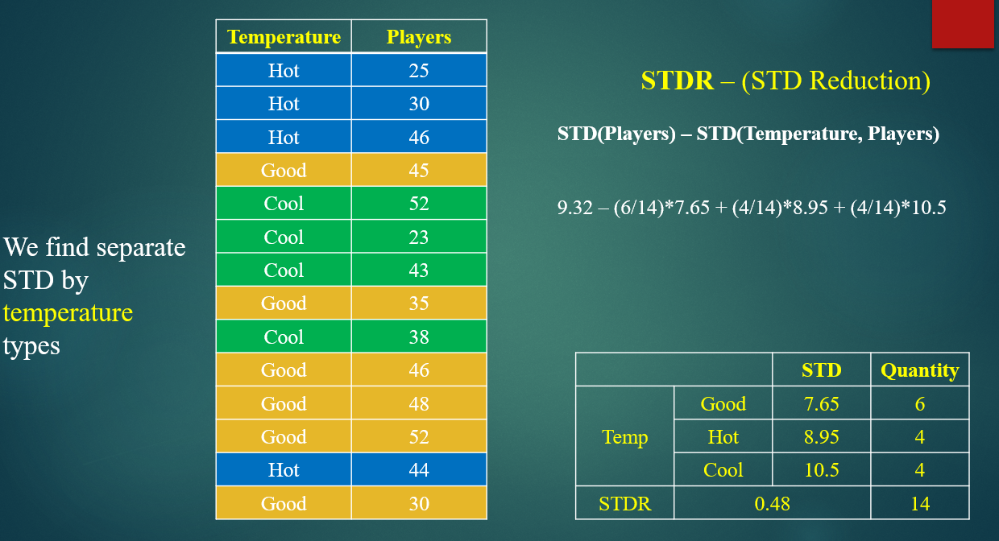

In [14]:
stdr_temp1 = target1.std() - np.dot(data_temp1["Quantity"]/14, data_temp1["Std"])
stdr_temp1


0.4796905747633211

# Step 7.1. We find the STD of the wind column

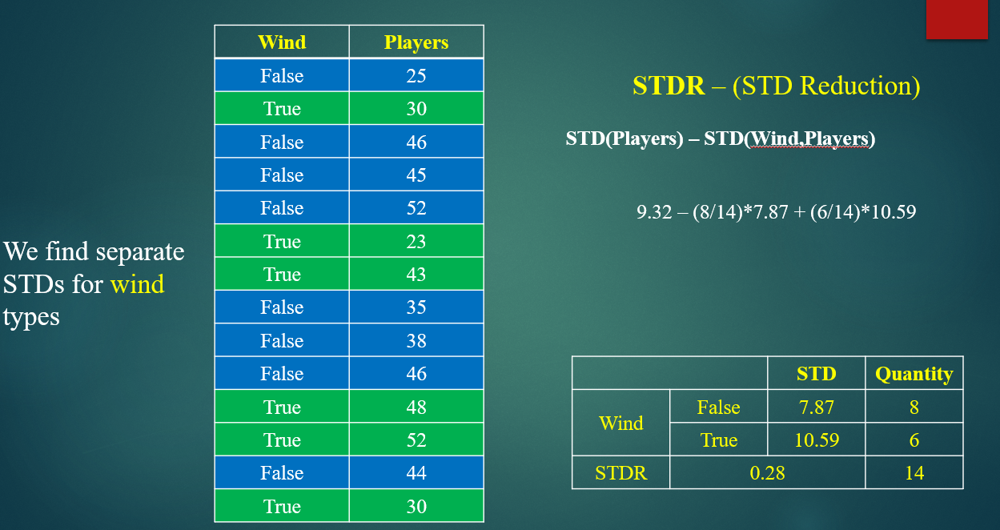

In [15]:
data_wind1 = data.groupby("Wind").agg(Std = ("Players", lambda x: x.std(ddof=0)), Quantity = ("Players", np.count_nonzero))
data_wind1


,Std,Quantity
Wind,,
False,7.873016,8
True,10.593499,6


# Step 7.2. We find the wind column STDR

In [16]:
stdr_wind1 = target1.std() - np.dot(data_wind1["Quantity"]/14, data_wind1["Std"])
stdr_wind1


0.28214938055733185

# Let's see all STDRs

In [17]:
all_stdr1 = [stdr_weather1, stdr_humidity1, stdr_temp1, stdr_wind1]
all_stdr1
# the largest is 1.66 weather, so we branch accordingly
# more simply, at the top of the decision tree, the weather is asked first

[1.6621503366302335,
 0.272296195489826,
 0.4796905747633211,
 0.28214938055733185]

# The biggest one is 1.66 weather so we'll branch out on that. More simply, at the top of the decision tree, the weather is asked first.

# Std and STDRs across all Columns

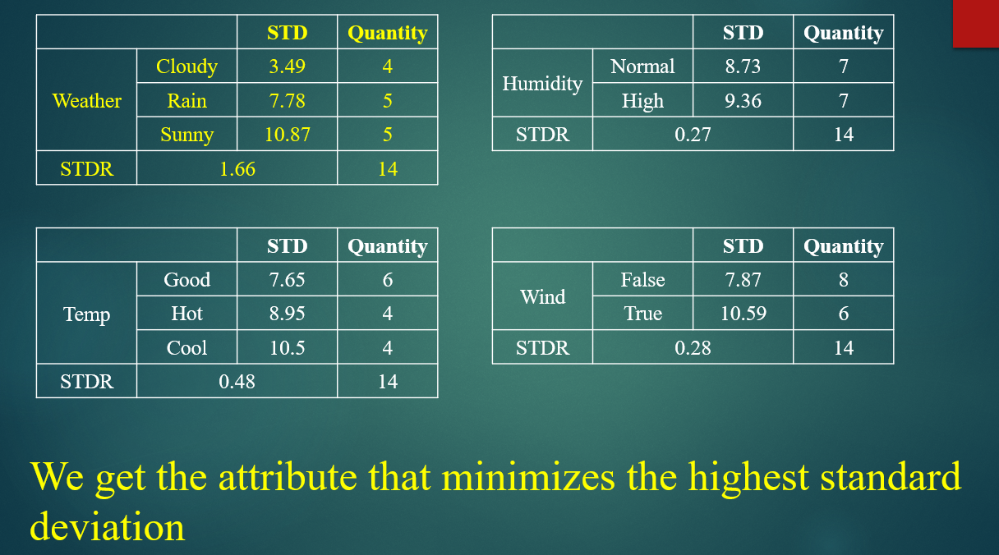

`The largest STDR in the Weather column means that it is the first to make a decision`

In [18]:
data_weather1

,Std,Quantity
Weather,,
Cloudy,3.491060,4
Rainy,7.782031,5
Sunny,10.870143,5


## ` So now we find STD and STDR for Temp, Humidity, Wind in each Weather i.e. Sunny weather `

### We can make separate data for cloudy values

In [19]:
data_cloudy1 = data[data["Weather"]=="Cloudy"]
data_cloudy1 = data_cloudy1[["Temp", "Humidity", "Wind", "Players"]]
data_cloudy1

,Temp,Humidity,Wind,Players
2,Hot,High,False,46
6,Cool,Normal,True,43
11,Good,High,True,52
12,Hot,Normal,False,44


# Step 8.2. In cloudy weather we find μ

In [20]:
myu_cloudy = np.sum(data_cloudy1["Players"])/4
myu_cloudy

46.25

# 8.3 - We find std in cloudy weather

In [21]:
cv_cloudy = data_weather1["Std"][0] / myu_cloudy * 100
cv_cloudy

7.548237861496725

In [22]:
weather="Cloudy"

if weather=="Cloudy":
    print(np.mean(data_cloudy1["Players"]))


46.25


If we look at the cloud, its cv is 7.5, and in our hypermeter, cv should be greater than 10 (we decided this ourselves). That's why we don't worry about it. Here we average the cloud values

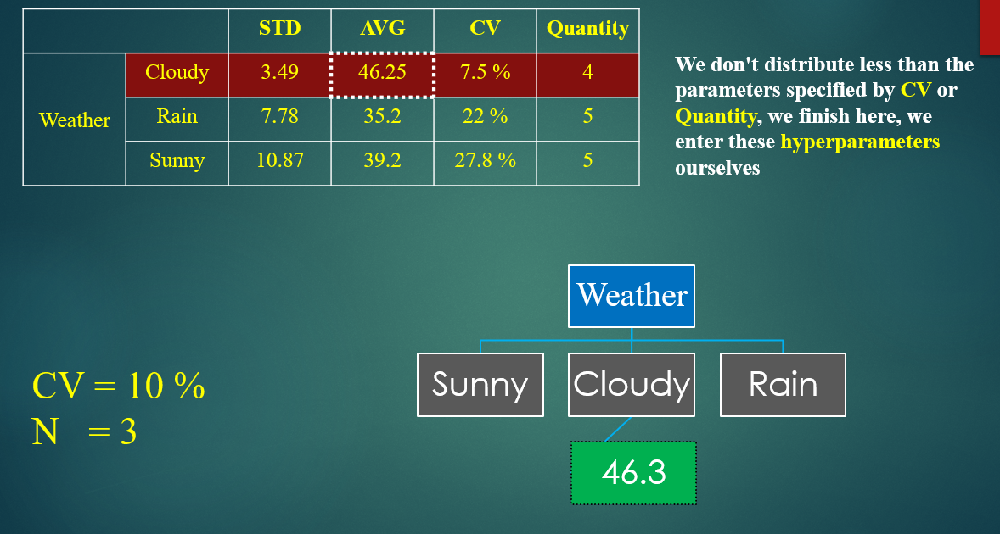

### `So we have an answer of 46.3 if the weather is cloudy.`

### Now let's look at the Sun

### We can make separate data for sunny values


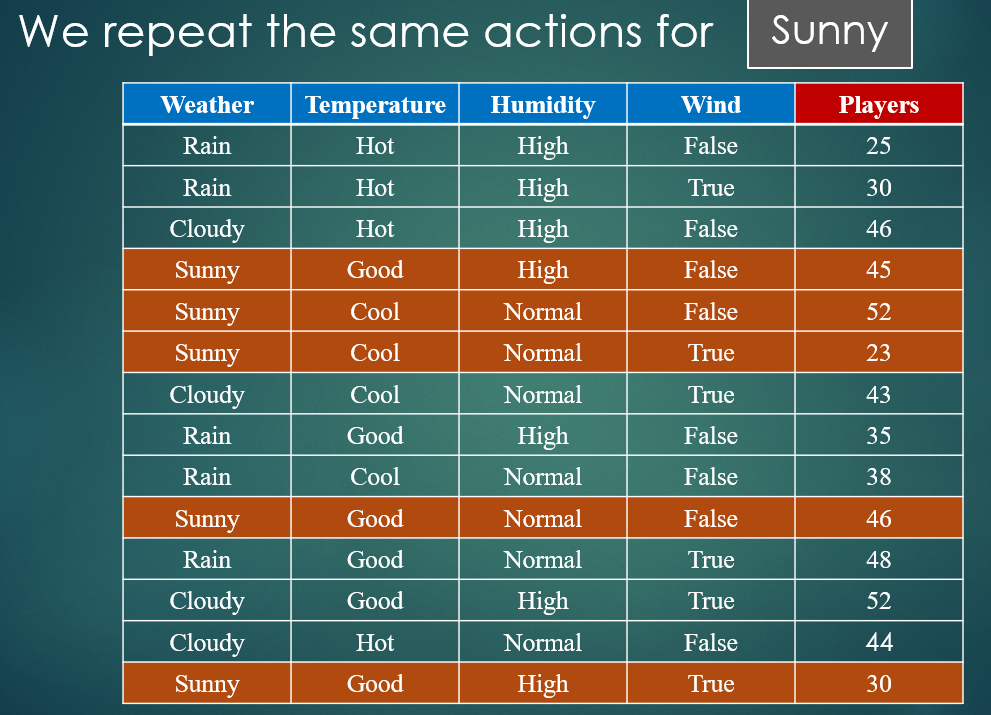

In [23]:
data_sunny1 = data[data["Weather"]=="Sunny"]
data_sunny1 = data_sunny1[["Temp", "Humidity", "Wind", "Players"]]
data_sunny1
# As shown in the picture above, we extracted the data of solar weather as a sub-dataset


,Temp,Humidity,Wind,Players
3,Good,High,False,45
4,Cool,Normal,False,52
5,Cool,Normal,True,23
9,Good,Normal,False,46
13,Good,High,True,30


## We can find the μ and Std from our target values for Sunny Weather

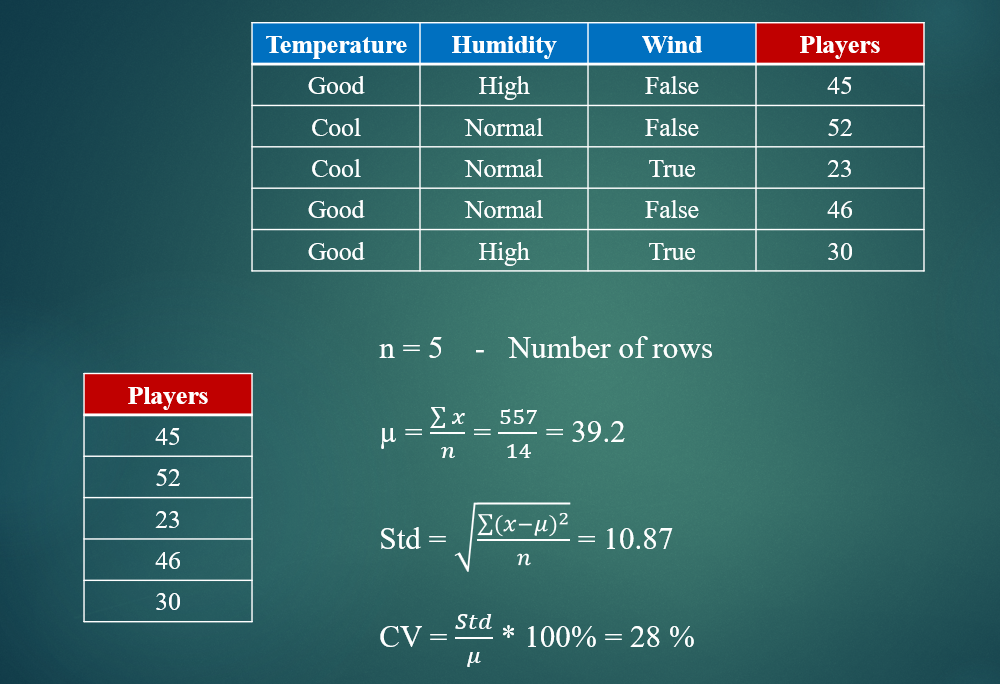

In [24]:
target_sunny = data_sunny1["Players"].to_numpy()
target_sunny

array([45, 52, 23, 46, 30], dtype=int64)

In [25]:
target_sunny.std()

10.870142593360953

# Step 9.1. Let's find STD for Temp in Sunny Weather

In [26]:
data_temp2 = data_sunny1.groupby("Temp").agg(Std = ("Players", lambda x: x.std(ddof=0)), AVG = ("Players", np.mean), Quantity = ("Players", np.count_nonzero))
data_temp2
# AVG The average value of the Players column


,Std,AVG,Quantity
Temp,,,
Cool,14.500000,37.500000,2
Good,7.318166,40.333333,3


# Step 9.2. In Sunny Weather we find STDR for Temp

In [27]:
stdr_temp2 = target_sunny.std() - np.dot(data_temp2["Quantity"]/5, data_temp2["Std"])
stdr_temp2


0.6792429133409215

# Step 10.1. We find STD for Moisture in Sunny Weather

In [28]:
data_humidity2 = data_sunny1.groupby("Humidity").agg(Std = ("Players", lambda x: x.std(ddof=0)), AVG = ("Players", np.mean), Quantity = ("Players", np.count_nonzero))
data_humidity2


,Std,AVG,Quantity
Humidity,,,
High,7.500000,37.500000,2
Normal,12.498889,40.333333,3


# 10.2 - step. We find STDR for Humidity in Sunny Weather

In [29]:
stdr_humidity2 = target_sunny.std() - np.dot(data_humidity2["Quantity"]/5, data_humidity2["Std"])
stdr_humidity2


0.37080928965988313

# Step 11.1. We find STD for Wind in Sunny Weather

In [30]:
data_wind2 = data_sunny1.groupby("Wind").agg(Std = ("Players", lambda x:x.std(ddof=0)), AVG = ("Players", np.mean), Quantity = ("Players", np.count_nonzero))
data_wind2


,Std,AVG,Quantity
Wind,,,
False,3.091206,47.666667,3
True,3.500000,26.500000,2


# 11.2 - step. We find the STDR for Wind in Sunny Weather

In [31]:
stdr_wind2 = target_sunny.std() - np.dot(data_wind2["Quantity"]/5, data_wind2["Std"])
stdr_wind2


7.615418894261811

# We have created the following tables

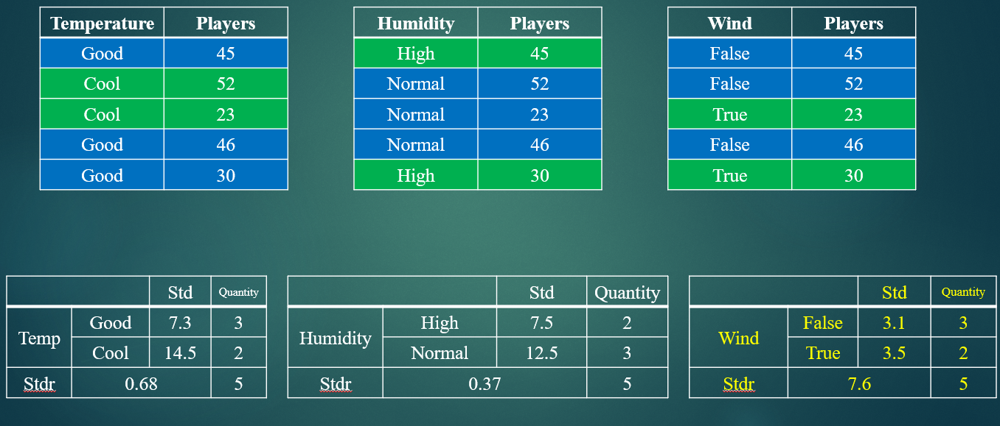

## As the highest STDR is in the Wind, it now makes a decision

* ### Our wind column consists of True and False values and now the decision is made accordingly. If Wind is True, all True values are averaged. If Wind is False all False values are averaged

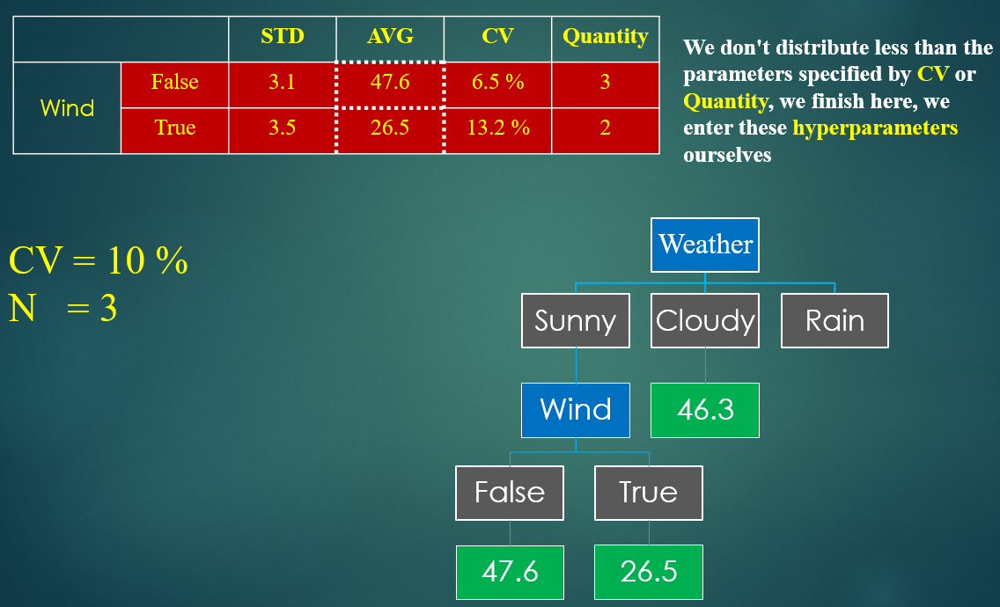

In [32]:
wind=False

if wind==True:
    print(np.mean( data_sunny1[data_sunny1["Wind"]==True]["Players"]))
else:
    print(np.mean( data_sunny1[data_sunny1["Wind"]==False]["Players"]))
    
    

47.666666666666664


In [33]:
wind=True

if wind==True:
    print(np.mean( data_sunny1[data_sunny1["Wind"]==True]["Players"]))
else:
    print(np.mean( data_sunny1[data_sunny1["Wind"]==False]["Players"]))

26.5


## Now we will check the Weather for Rain

### We can make separate data for rainy values.

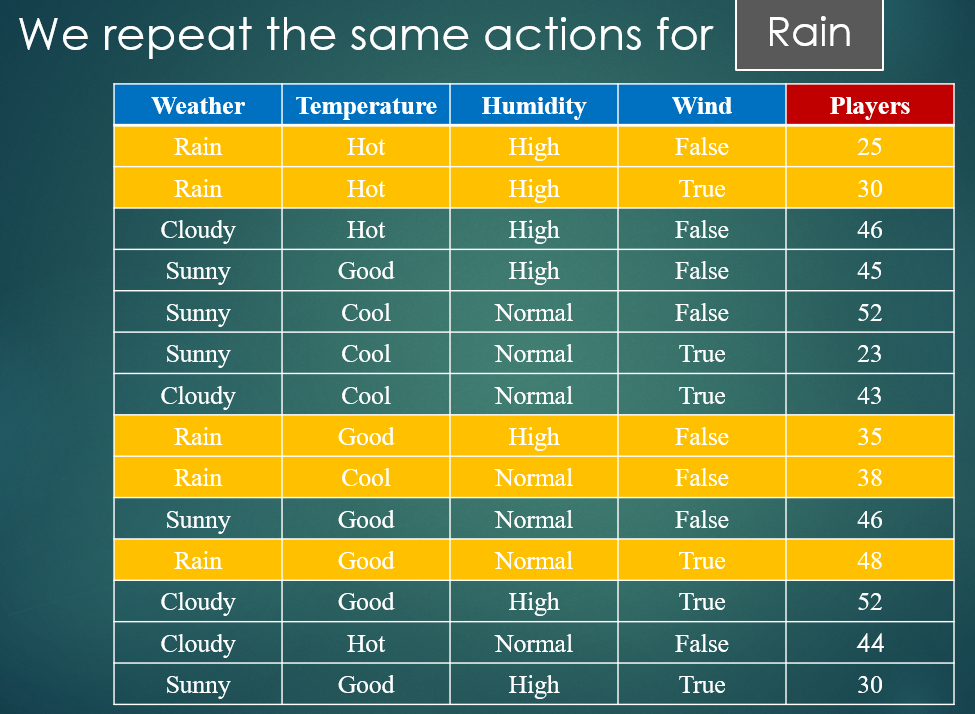

In [34]:
data_rain1 = data[data["Weather"]=="Rainy"]
data_rain1 = data_rain1[["Temp", "Humidity", "Wind", "Players"]]
data_rain1

,Temp,Humidity,Wind,Players
0,Hot,High,False,25
1,Hot,High,True,30
7,Good,High,False,35
8,Cool,Normal,False,38
10,Good,Normal,True,48


## We find a separate target for rainy weather.

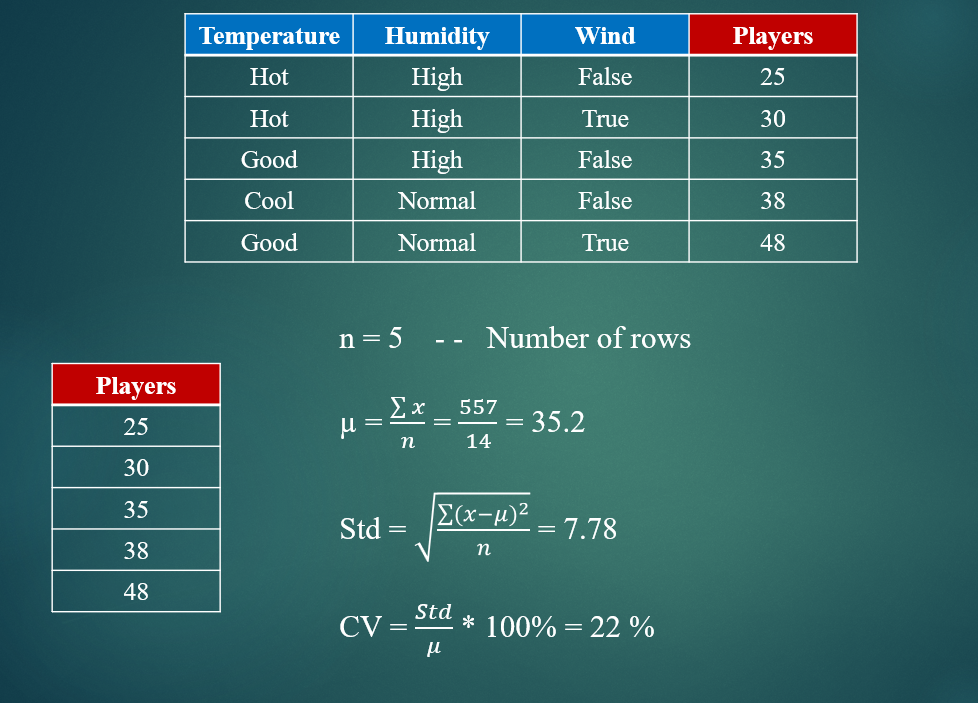

In [35]:
target_rain = data_rain1["Players"].to_numpy()
target_rain

array([25, 30, 35, 38, 48], dtype=int64)

In [36]:
target_rain.std()

7.782030583337487

# Step 12.1. We find STD for Temp in Rainy Weather

In [37]:
data_temp3 = data_rain1.groupby("Temp").agg(Std = ("Players", lambda x: x.std(ddof=0)), AVG = ("Players", np.mean), Quantity = ("Players", np.count_nonzero))
data_temp3


,Std,AVG,Quantity
Temp,,,
Cool,0.0,38.0,1
Good,6.5,41.5,2
Hot,2.5,27.5,2


# Step 12.2. We find STDR for Temp in Rainy Weather

In [38]:
stdr_temp3 = target_rain.std() - np.dot(data_temp3["Quantity"]/5, data_temp3["Std"])
stdr_temp3


4.182030583337488

# Step 13.1. We find STD for Moisture in Rainy Weather

In [39]:
data_humidity3 = data_rain1.groupby("Humidity").agg(Std = ("Players", lambda x:x.std(ddof=0)), AVG = ("Players", np.mean), Quantity = ("Players", np.count_nonzero))
data_humidity3


,Std,AVG,Quantity
Humidity,,,
High,4.082483,30.0,3
Normal,5.000000,43.0,2


# Step 13.2. We find STDR for Humidity in Rainy Weather

In [40]:
stdr_humidity3 = target_rain.std() - np.dot(data_humidity3["Quantity"]/5, data_humidity3["Std"])
stdr_humidity3


3.3325408405543087

# Step 14.1. We find STD for Wind in Rainy Weather

In [41]:
data_wind3 = data_rain1.groupby("Wind").agg(Std = ("Players", lambda x: x.std(ddof=0)), AVG = ("Players", np.mean), Quantity = ("Players", np.count_nonzero))
data_wind3


,Std,AVG,Quantity
Wind,,,
False,5.557777,32.666667,3
True,9.000000,39.000000,2


In [42]:
stdr_wind3 = target_rain.std() - np.dot(data_wind3["Quantity"]/5, data_wind3["Std"])
stdr_wind3


0.8473641832308747

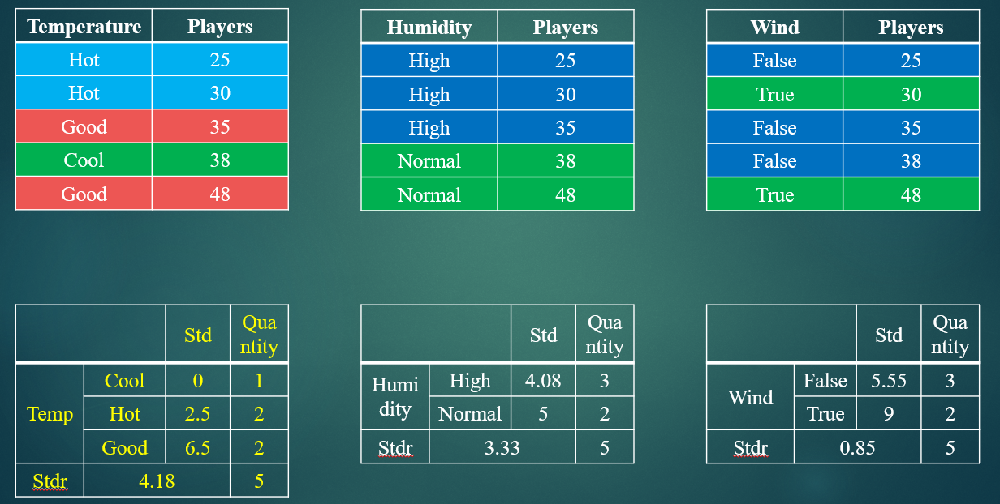

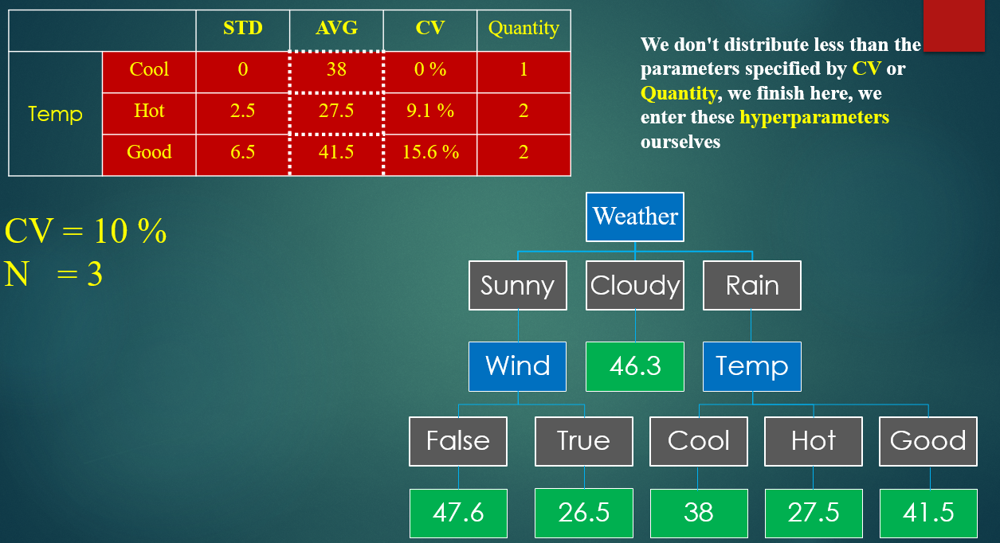

In [43]:
temp = "Cool"

if temp=="Hot":
    print(np.mean( data_rain1[data_rain1["Temp"]=="Hot"]["Players"]))
elif temp=="Good":
    print(np.mean( data_rain1[data_rain1["Temp"]=="Good"]["Players"]))
else:
    print(np.mean( data_rain1[data_rain1["Temp"]=="Cool"]["Players"]))
    

38.0


In [44]:
temp = "Hot"

if temp=="Hot":
    print(np.mean( data_rain1[data_rain1["Temp"]=="Hot"]["Players"]))
elif temp=="Good":
    print(np.mean( data_rain1[data_rain1["Temp"]=="Good"]["Players"]))
else:
    print(np.mean( data_rain1[data_rain1["Temp"]=="Cool"]["Players"]))
    

27.5


In [45]:
temp = "Good"

if temp=="Hot":
    print(np.mean( data_rain1[data_rain1["Temp"]=="Hot"]["Players"]))
elif temp=="Good":
    print(np.mean( data_rain1[data_rain1["Temp"]=="Good"]["Players"]))
else:
    print(np.mean( data_rain1[data_rain1["Temp"]=="Cool"]["Players"]))
    

41.5


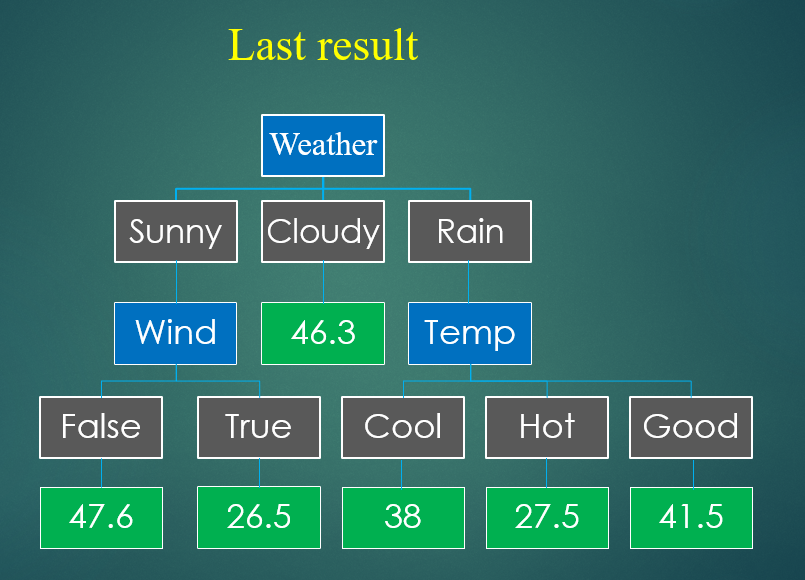

In [ ]:
#If we have found a decision maker through stdr in Regression problem

#In Classficaton, you need to find Entropy index and Information gain

# Which one has the highest Information gain will be the main decision maker


# <center> Decision Tree Classifier

In [46]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.preprocessing import OrdinalEncoder
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [49]:
data = pd.read_csv("Datasets/DTree2.csv")
data

,Weather,Temp,Humidity,Wind,Players
0,Rainy,Hot,High,False,25
1,Rainy,Hot,High,True,30
2,Cloudy,Hot,High,False,46
3,Sunny,Good,High,False,45
4,Sunny,Cool,Normal,False,52
5,Sunny,Cool,Normal,True,23
6,Cloudy,Cool,Normal,True,43
7,Rainy,Good,High,False,35
8,Rainy,Cool,Normal,False,38
9,Sunny,Good,Normal,False,46


In [50]:
# we have our dataset for regression, we leave it at that
# we change it for classification
# i.e. 0 did not play, 1 played

for i in range(len(data)):
    print(data.loc[i, "Players"])
    data.loc[i, "Players"] = int(input("= "))

25
= 0
30
= 1
46
= 1
45
= 1
52
= 0
23
= 0
43
= 0
35
= 1
38
= 1
46
= 1
48
= 0
52
= 1
44
= 0
30
= 1


In [51]:
data
# We corrected the data for classification

,Weather,Temp,Humidity,Wind,Players
0,Rainy,Hot,High,False,0
1,Rainy,Hot,High,True,1
2,Cloudy,Hot,High,False,1
3,Sunny,Good,High,False,1
4,Sunny,Cool,Normal,False,0
5,Sunny,Cool,Normal,True,0
6,Cloudy,Cool,Normal,True,0
7,Rainy,Good,High,False,1
8,Rainy,Cool,Normal,False,1
9,Sunny,Good,Normal,False,1


#  Step 1 We find the entropy of Label.

In [52]:
true_class = len(data[data["Players"]==1])
true_class
# To find the entropy, we first need the number of true and false values


8

In [53]:
false_class = len(data[data["Players"]==0])
false_class

6

In [ ]:
#The entropy formula is -y*log(y_hat)

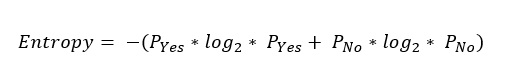

# Step 2.1. Now we find the ratio of true_classes to the total number of classes.

In [54]:
true_class_rate = true_class / 14
true_class_rate
# P_Yes

0.5714285714285714

# Step 2.2. Now we find the ratio of false_classes to the total number of classes

In [55]:
false_class_rate = false_class / 14
false_class_rate
# P_No

0.42857142857142855

In [ ]:
# Entropy(false_class_rate, true_class_rate) = -true_class_rate * log(true_class_rate) - false_class_rate * log(false_class_rate)

# -y*log(y_hat) = -true_class_rate*log2(true_class_rate) - false_class_rate*log2(false_class_rate)


In [56]:
entropy_label = -true_class_rate*np.log2(true_class_rate) - false_class_rate*np.log2(false_class_rate)
entropy_label


0.9852281360342515

# Step 3. For each variable in the weather column, we find the entropy of Rainy, Cloudy, Sunny with respect to the label.

In [57]:
data

,Weather,Temp,Humidity,Wind,Players
0,Rainy,Hot,High,False,0
1,Rainy,Hot,High,True,1
2,Cloudy,Hot,High,False,1
3,Sunny,Good,High,False,1
4,Sunny,Cool,Normal,False,0
5,Sunny,Cool,Normal,True,0
6,Cloudy,Cool,Normal,True,0
7,Rainy,Good,High,False,1
8,Rainy,Cool,Normal,False,1
9,Sunny,Good,Normal,False,1


In [58]:
data[data["Weather"]=="Rainy"]
# So Weather We will see Rain
# we need players in Rainy weather
# in rainy weather true=1(3), false=0(2)

,Weather,Temp,Humidity,Wind,Players
0,Rainy,Hot,High,False,0
1,Rainy,Hot,High,True,1
7,Rainy,Good,High,False,1
8,Rainy,Cool,Normal,False,1
10,Rainy,Good,Normal,True,0


In [59]:
data[data["Weather"]=="Cloudy"]
# The weather is cloudy
# means we will see players classes in cloudy weather
# in cloudy weather true=1(2), false=0(2)

,Weather,Temp,Humidity,Wind,Players
2,Cloudy,Hot,High,False,1
6,Cloudy,Cool,Normal,True,0
11,Cloudy,Good,High,True,1
12,Cloudy,Hot,Normal,False,0


In [60]:
data[data["Weather"]=="Sunny"]
# Weather We see sunshine
# means players need classes in sunny weather
# in sunny weather true=1(3), false=0(2)

,Weather,Temp,Humidity,Wind,Players
3,Sunny,Good,High,False,1
4,Sunny,Cool,Normal,False,0
5,Sunny,Cool,Normal,True,0
9,Sunny,Good,Normal,False,1
13,Sunny,Good,High,True,1


`This formula is the same as the formula above, only the way it is written is different.😊`

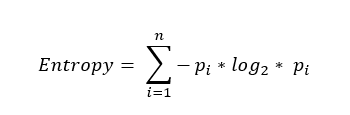



In [61]:
# Now that we know the number of player classes for each weather
# Let's calculate the entropy

entropy_weather_label = ( (-(3/5)*np.log(3/5) - (2/5)*np.log(2/5))*5/14 + ( -(2/4)*np.log(2/4) - (2/4)*np.log(2/4) )*4/14 + ( -(3/5)*np.log(3/5) - (2/5)*np.log(2/5)*5/14 ) )
entropy_weather_label

# where first and second 3/5 is the weather for rain, 3 is the number of true values, 5 is the number of total clouds
# 5/14, 5 total weather rain count, 14 total data count
# where first and second 2/5 is the weather for rain, 2 is the number of true values, 5 is the total number of Suns


0.8757974114763354

# Step 4. We find the entropy of each variable in the Temp column relative to the label for Hot, Good, Cool.

In [62]:
data

,Weather,Temp,Humidity,Wind,Players
0,Rainy,Hot,High,False,0
1,Rainy,Hot,High,True,1
2,Cloudy,Hot,High,False,1
3,Sunny,Good,High,False,1
4,Sunny,Cool,Normal,False,0
5,Sunny,Cool,Normal,True,0
6,Cloudy,Cool,Normal,True,0
7,Rainy,Good,High,False,1
8,Rainy,Cool,Normal,False,1
9,Sunny,Good,Normal,False,1


In [ ]:
# Entropy(feature_2, label)

In [ ]:
# Second, we find the entopy of Temp with respect to the label
# temp we have divided into 3 Hot, Good and Cool
# So we divide the data by 3

In [63]:
data[data["Temp"]=="Hot"]
# Let's see Temp Heat
# means we will see players classes at a hot pace
# in hot temp true=1(2), false=0(2)

,Weather,Temp,Humidity,Wind,Players
0,Rainy,Hot,High,False,0
1,Rainy,Hot,High,True,1
2,Cloudy,Hot,High,False,1
12,Cloudy,Hot,Normal,False,0


In [64]:
data[data["Temp"]=="Good"]
# We'll see Temp Good
# means we will see players classes at a good pace
# at a good pace true=1(5), false=0(1)

,Weather,Temp,Humidity,Wind,Players
3,Sunny,Good,High,False,1
7,Rainy,Good,High,False,1
9,Sunny,Good,Normal,False,1
10,Rainy,Good,Normal,True,0
11,Cloudy,Good,High,True,1
13,Sunny,Good,High,True,1


In [65]:
data[data["Temp"]=="Cool"]
#Let's see the cool temp
# means we will see player classes at a cool pace
# in cool temp true=1(1), false=0(3)

,Weather,Temp,Humidity,Wind,Players
4,Sunny,Cool,Normal,False,0
5,Sunny,Cool,Normal,True,0
6,Cloudy,Cool,Normal,True,0
8,Rainy,Cool,Normal,False,1


In [66]:
# Now that we know the number of player classes for each Temp
# Let's calculate the entropy

entropy_temp_label = (-(2/4)*np.log(2/4) - (2/4)*np.log(2/4))*4/14 + ( -(5/6)*np.log(5/6) - (1/6)*np.log(1/6) )*6/14 + ( -(1/4)*np.log(1/4) - (3/4)*np.log(3/4) )*4/14
entropy_temp_label


0.5518068967080602

# Step 5. Find the entropy of each variable in the humidity column relative to the label for High, Normal.

In [67]:
data

,Weather,Temp,Humidity,Wind,Players
0,Rainy,Hot,High,False,0
1,Rainy,Hot,High,True,1
2,Cloudy,Hot,High,False,1
3,Sunny,Good,High,False,1
4,Sunny,Cool,Normal,False,0
5,Sunny,Cool,Normal,True,0
6,Cloudy,Cool,Normal,True,0
7,Rainy,Good,High,False,1
8,Rainy,Cool,Normal,False,1
9,Sunny,Good,Normal,False,1


In [ ]:
# Entropy(feature_3, label)

In [ ]:
# Thirdly, we find the entopy of the humidity with respect to the label
# humidity divided by 2 is Normal, High
# So we divide the data by 2

In [68]:
data[data["Humidity"]=="Normal"]
# Let's see the humidity Normal
# means we will see player classes in normal humidity
# in normal humidity true=1(2), false=0(5)

,Weather,Temp,Humidity,Wind,Players
4,Sunny,Cool,Normal,False,0
5,Sunny,Cool,Normal,True,0
6,Cloudy,Cool,Normal,True,0
8,Rainy,Cool,Normal,False,1
9,Sunny,Good,Normal,False,1
10,Rainy,Good,Normal,True,0
12,Cloudy,Hot,Normal,False,0


In [69]:
data[data["Humidity"]=="High"]
# Humidity humidity
# means we will see player classes in high humidity
# In high humidity, true=1(if 6), false=0(if 1)

,Weather,Temp,Humidity,Wind,Players
0,Rainy,Hot,High,False,0
1,Rainy,Hot,High,True,1
2,Cloudy,Hot,High,False,1
3,Sunny,Good,High,False,1
7,Rainy,Good,High,False,1
11,Cloudy,Good,High,True,1
13,Sunny,Good,High,True,1


In [70]:
# Now that we know the number of player classes for each Nation
# Let's calculate the entropy

entropy_humidity_label = (-(2/7)*np.log(2/7) - (5/7)*np.log(5/7))*7/14 + ( -(6/7)*np.log(6/7) - (1/7)*np.log(1/7))*7/14  
entropy_humidity_label



0.5041929534368331

# Step 6. For each variable in the wind column, we find the entropy relative to the label for False, True.

In [71]:
data

,Weather,Temp,Humidity,Wind,Players
0,Rainy,Hot,High,False,0
1,Rainy,Hot,High,True,1
2,Cloudy,Hot,High,False,1
3,Sunny,Good,High,False,1
4,Sunny,Cool,Normal,False,0
5,Sunny,Cool,Normal,True,0
6,Cloudy,Cool,Normal,True,0
7,Rainy,Good,High,False,1
8,Rainy,Cool,Normal,False,1
9,Sunny,Good,Normal,False,1


In [ ]:
# Now we find for the wind
# Entropy(feature_4, label)

In [ ]:
# Fourth, we find the entopy of the Wind label
# We have wind divided into 2 True, False
# So we divide the data by 2

In [72]:
data[data["Wind"]==True]
# We will see the wind True
# means we will see Shamal Tru player classes
# True In the wind, true=1(3), false=0(3)

,Weather,Temp,Humidity,Wind,Players
1,Rainy,Hot,High,True,1
5,Sunny,Cool,Normal,True,0
6,Cloudy,Cool,Normal,True,0
10,Rainy,Good,Normal,True,0
11,Cloudy,Good,High,True,1
13,Sunny,Good,High,True,1


In [73]:
data[data["Wind"]==False]
# We see the wind False
# means we will see Shamal False and player classes
# False In the wind, true=1(5), false=0(3)

,Weather,Temp,Humidity,Wind,Players
0,Rainy,Hot,High,False,0
2,Cloudy,Hot,High,False,1
3,Sunny,Good,High,False,1
4,Sunny,Cool,Normal,False,0
7,Rainy,Good,High,False,1
8,Rainy,Cool,Normal,False,1
9,Sunny,Good,Normal,False,1
12,Cloudy,Hot,Normal,False,0


In [74]:
# Now that we know the number of player classes for each Wind
# Let's calculate the entropy

entropy_wind_label = (-(3/6)*np.log(3/6) - (3/6)*np.log(3/6))*6/14 + (-(5/8)*np.log(5/8) - (3/8)*np.log(3/8))*8/14
entropy_wind_label



0.6750992134731091

# Step 7. We subtract the entropy of the remaining columns from the total entropy. This gives us Information gain, which is the highest decision.


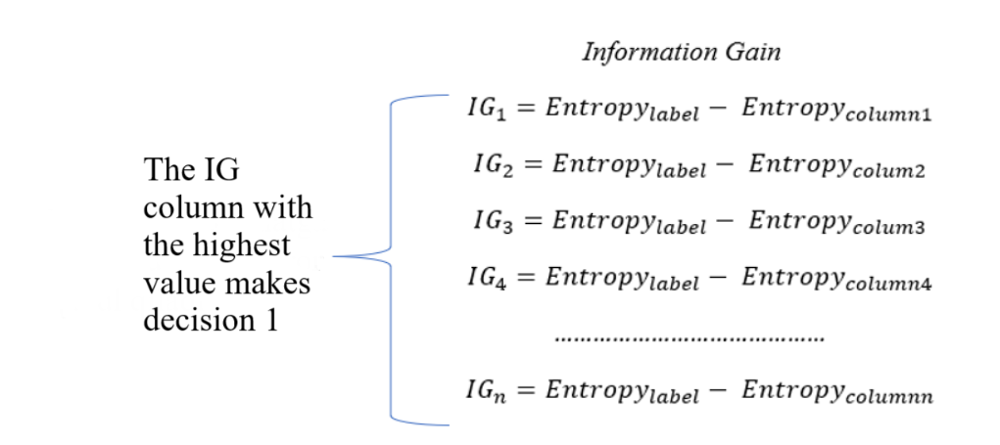

In [75]:
# we subtract the entropies of the remaining columns from the total entropy (entropy of the players).
entropy_label - entropy_weather_label


0.10943072455791614

In [76]:
entropy_label - entropy_temp_label

0.43342123932619137

In [77]:
entropy_label - entropy_humidity_label

0.4810351825974184

In [78]:
entropy_label - entropy_wind_label

0.31012892256114244

# The highest value is in Humidity, so we make a decision by this

## `That is, the first thing we ask from the forecast data is humidity`

In [79]:
data

,Weather,Temp,Humidity,Wind,Players
0,Rainy,Hot,High,False,0
1,Rainy,Hot,High,True,1
2,Cloudy,Hot,High,False,1
3,Sunny,Good,High,False,1
4,Sunny,Cool,Normal,False,0
5,Sunny,Cool,Normal,True,0
6,Cloudy,Cool,Normal,True,0
7,Rainy,Good,High,False,1
8,Rainy,Cool,Normal,False,1
9,Sunny,Good,Normal,False,1


In [80]:
# Now we divide the data into sub-datasets for Normal and High Humidity cases
data[data["Humidity"]=="Normal"]


,Weather,Temp,Humidity,Wind,Players
4,Sunny,Cool,Normal,False,0
5,Sunny,Cool,Normal,True,0
6,Cloudy,Cool,Normal,True,0
8,Rainy,Cool,Normal,False,1
9,Sunny,Good,Normal,False,1
10,Rainy,Good,Normal,True,0
12,Cloudy,Hot,Normal,False,0


In [81]:
data[data["Humidity"]=="High"]


,Weather,Temp,Humidity,Wind,Players
0,Rainy,Hot,High,False,0
1,Rainy,Hot,High,True,1
2,Cloudy,Hot,High,False,1
3,Sunny,Good,High,False,1
7,Rainy,Good,High,False,1
11,Cloudy,Good,High,True,1
13,Sunny,Good,High,True,1


In [82]:
# Now we close the individual entopies for the above sub-dataset
entropy_normal = (-(2/7)*np.log(2/7) - (5/7)*np.log(5/7))*7/14
entropy_normal

0.2991347942926286

In [83]:
entropy_high = ( -(6/7)*np.log(6/7) - (1/7)*np.log(1/7))*7/14
entropy_high

0.2050581591442045

In [84]:
# The entropy of normal humidity is high
hum_norm = data[data["Humidity"]=="Normal"]
hum_norm

,Weather,Temp,Humidity,Wind,Players
4,Sunny,Cool,Normal,False,0
5,Sunny,Cool,Normal,True,0
6,Cloudy,Cool,Normal,True,0
8,Rainy,Cool,Normal,False,1
9,Sunny,Good,Normal,False,1
10,Rainy,Good,Normal,True,0
12,Cloudy,Hot,Normal,False,0


In [85]:
# now we can find the number of true and false values in Humidity Normal
true_class2 = sum(hum_norm["Players"]==1)
true_class2

2

In [86]:
false_class2 = sum(hum_norm["Players"]==0)
false_class2

5

In [87]:
true_class_rate2 = true_class2 / 7
true_class_rate2

0.2857142857142857

In [88]:
false_class_rate2 = false_class2 / 7
false_class_rate2

0.7142857142857143

In [89]:
entropy_label2 = -true_class_rate2*np.log2(true_class_rate2) - false_class_rate2*np.log2(false_class_rate2)
entropy_label2
# this is the entropy of the labels for the sub-dataset when Humidity is Normal

0.863120568566631

## `So we know that Humidity is the first to decide and then we compared the entropy of Normal and High values of Humidity and we have Normal is higher. Therefore, in sub-datasets where Humidity is Normal, we find entropies in other columns.`

In [90]:
# So we can find the number of classes when the Weather is Rainy in the sub-dataset where Humidity is Normal.
hum_norm[hum_norm["Weather"]=="Rainy"]
# So we see Rainfall in the Humidity sub-dataset
# we need players in the Rainy Humidity sub dataset
# in rainy weather true=1(1), false=0(1)

,Weather,Temp,Humidity,Wind,Players
8,Rainy,Cool,Normal,False,1
10,Rainy,Good,Normal,True,0


In [91]:
# So we can find the number of classes when the Weather is Cloudy in the sub-dataset where Humidity is Normal
hum_norm[hum_norm["Weather"]=="Cloudy"]
# In the sub-dataset with high humidity, we see weather cloudiness
# means we will see players classes in cloudy weather
# in cloudy weather true=1(0), false=0(2)


,Weather,Temp,Humidity,Wind,Players
6,Cloudy,Cool,Normal,True,0
12,Cloudy,Hot,Normal,False,0


In [92]:
# So we can find the number of classes when the weather is sunny in the sub-dataset where the humidity is normal
hum_norm[hum_norm["Weather"]=="Sunny"]
# We see Weather Sunny in the sub-dataset with high humidity
# means we will see players classes in sunny weather
# In sunny weather true=1(1), false=0(2)

,Weather,Temp,Humidity,Wind,Players
4,Sunny,Cool,Normal,False,0
5,Sunny,Cool,Normal,True,0
9,Sunny,Good,Normal,False,1


In [93]:
# Now that we know the number of player classes for each weather
# Let's calculate the entropy

entropy_weather_label2 = ( (-(1/2)*np.log(1/2) - (1/2)*np.log(1/2))*2/7 + ( 0 - (2/2)*np.log(2/2) )*2/7 + ( -(1/3)*np.log(1/3) - (2/3)*np.log(2/3)*3/7 ) )
entropy_weather_label2


0.6800933215564489

In [ ]:
# where first and second 1/2 is the weather for rain, 1 is the number of true values, 2 is the number of total clouds
# 2/2, 2 total weather rain count, 7 total data count

In [94]:
# This is now done for the Temp column
# So we can find the number of classes when the Temp is Hot in the sub-dataset where the Humidity is Normal
hum_norm[hum_norm["Temp"]=="Hot"]
# In the sub-dataset with high humidity, we see Temp Warm
# means we see player classes in Temp
# In heat, true=1(0), false=0(1)

,Weather,Temp,Humidity,Wind,Players
12,Cloudy,Hot,Normal,False,0


In [95]:
# So we can find the number of classes when the Temp is Hot in the sub-dataset where the Humidity is Normal
hum_norm[hum_norm["Temp"]=="Good"]
# We see Temp Good in the sub dataset with high humidity
# means we'll see the player classes
# in good case true=1(1), false=0(1)

,Weather,Temp,Humidity,Wind,Players
9,Sunny,Good,Normal,False,1
10,Rainy,Good,Normal,True,0


In [96]:
# So we can find the number of classes when the Temp is Hot in the sub-dataset where the Humidity is Normal
hum_norm[hum_norm["Temp"]=="Cool"]
# In the sub-dataset with high humidity, we see Temp cool
# means we will see the players' classes in the cool
# in cold true=1(1), false=0(3)

,Weather,Temp,Humidity,Wind,Players
4,Sunny,Cool,Normal,False,0
5,Sunny,Cool,Normal,True,0
6,Cloudy,Cool,Normal,True,0
8,Rainy,Cool,Normal,False,1


In [97]:
# Now that we know the number of player classes for each Temp
# Let's calculate the entropy

entropy_temp_label2 = (0 - (1/1)*np.log(1/1))*1/7 + ( -(1/1)*np.log(1/1) - (1/1)*np.log(1/1) )*2/7 + ( -(1/4)*np.log(1/4) - (3/4)*np.log(3/4) )*4/7
entropy_temp_label2


0.32133436835360474

In [98]:
# Now the same situation is done for the Wind column
# So we can find the number of classes when Wind is True in the sub-dataset where Humidity is Normal
hum_norm[hum_norm["Wind"]==True]
# We see the wind is true in the sub dataset with high humidity
# means truede we will see player classes
# in true true=1(0), false=0(3)


,Weather,Temp,Humidity,Wind,Players
5,Sunny,Cool,Normal,True,0
6,Cloudy,Cool,Normal,True,0
10,Rainy,Good,Normal,True,0


In [99]:
# So we can find the number of classes when Wind is False in the sub-dataset where Humidity is Normal
hum_norm[hum_norm["Wind"]==False]
# We see wind false in the sub dataset with high humidity
# means we will see player classes in false
# in false true=1(2), false=0(2)

,Weather,Temp,Humidity,Wind,Players
4,Sunny,Cool,Normal,False,0
8,Rainy,Cool,Normal,False,1
9,Sunny,Good,Normal,False,1
12,Cloudy,Hot,Normal,False,0


In [100]:
# Now that we know the number of player classes for each Wind
# Let's calculate the entropy

entropy_wind_label2 = (0 - (3/3)*np.log(3/3))*3/7 + (-(2/3)*np.log(2/3) - (2/3)*np.log(2/3))*4/7
entropy_wind_label2


0.30892579665383957

### We find the Information Gain for the sub dataset when humidity is Normal

In [101]:
entropy_label2 - entropy_weather_label2

0.18302724701018214

In [102]:
entropy_label2 - entropy_temp_label2

0.5417862002130263

In [103]:
entropy_label2 - entropy_wind_label2

0.5541947719127914

# The highest means the wind, so now he decides.

# To summarize, we have the new data at the beginning of our tree asking for humidity, if the humidity is normal, then the next branch will ask for wind and so on. If our tree ends here, it will be predicted based on the number of true and false classes here, that is, if there are 5 true classes and 3 false classes, it will return a true value


In [104]:
hum_norm
# if our tree ended here
# we have 4 false values and 3 true values
# this would have given us the value of our tree returning False=0

,Weather,Temp,Humidity,Wind,Players
4,Sunny,Cool,Normal,False,0
5,Sunny,Cool,Normal,True,0
6,Cloudy,Cool,Normal,True,0
8,Rainy,Cool,Normal,False,1
9,Sunny,Good,Normal,False,1
10,Rainy,Good,Normal,True,0
12,Cloudy,Hot,Normal,False,0


# <center> Implementation in Sklearn

 

In [105]:
from sklearn.tree import DecisionTreeClassifier

In [106]:
dt = DecisionTreeClassifier(criterion="entropy") # Since we also calculate by entropy, we will show it as entopy
dt


DecisionTreeClassifier(criterion='entropy')

In [107]:
ordinal = OrdinalEncoder()

In [108]:
ordinal.fit(data.drop("Players", axis=1))

OrdinalEncoder()

In [109]:
ordinal.categories_

[array(['Cloudy', 'Rainy', 'Sunny'], dtype=object),
 array(['Cool', 'Good', 'Hot'], dtype=object),
 array(['High', 'Normal'], dtype=object),
 array([False,  True])]

In [110]:
data_x = ordinal.transform(data.drop("Players", axis=1))
data_x

array([[1., 2., 0., 0.],
       [1., 2., 0., 1.],
       [0., 2., 0., 0.],
       [2., 1., 0., 0.],
       [2., 0., 1., 0.],
       [2., 0., 1., 1.],
       [0., 0., 1., 1.],
       [1., 1., 0., 0.],
       [1., 0., 1., 0.],
       [2., 1., 1., 0.],
       [1., 1., 1., 1.],
       [0., 1., 0., 1.],
       [0., 2., 1., 0.],
       [2., 1., 0., 1.]])

In [175]:
dt.fit(data_x, data["Players"])

DecisionTreeClassifier(criterion='entropy')

In [176]:
data.loc[0]

Weather     Rainy
Temp          Hot
Humidity     High
Wind        False
Players         0
Name: 0, dtype: object

In [177]:
data_x[0]

array([1., 2., 0., 0.])

In [178]:
dt.predict([data_x[0]])

array([0], dtype=int64)

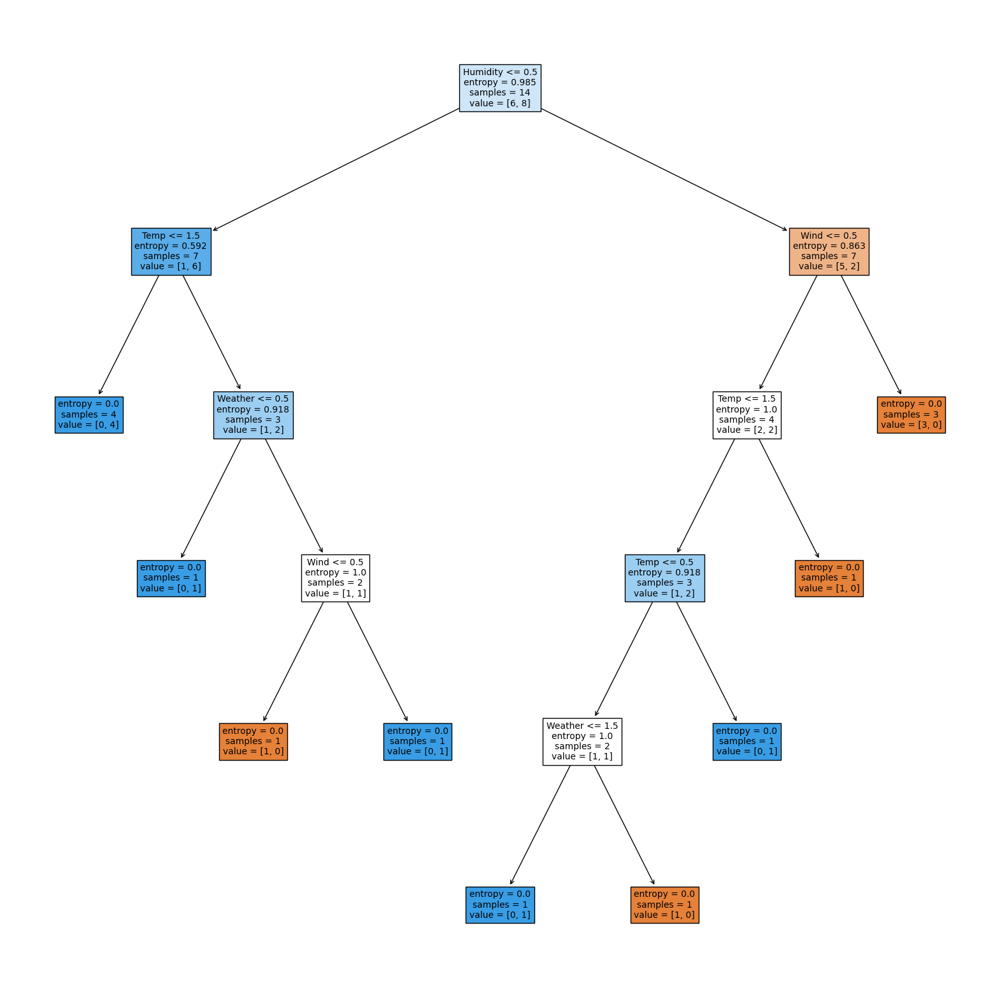

In [184]:
plt.figure(figsize=(20,20))
plot_tree(dt, filled=True, fontsize=10, feature_names=data.columns.tolist())
plt.show()
# if we look at the entropy in the first branch it is 0.985 and it was the same when we worked manually
# 14 in total at the beginning of the sample
# and value means there are 6 0 classes and 8 1 classes
# is the same
# here checks if humidity is high or low 0.5
# then we have Temp checked for less than or greater than 1.5
# if it passes, it goes down 1 branch to the left again
# stop branching here if entropy = 0
# If we notice where Wind <=0.5 is checking
# sample = 2, value = [1,1]
# that is, the branch here says both 0 and 1 correctly, this situation is not good
# to avoid such cases, we can use Random Forest


# <center> <h1> 👨‍💻   🚀  